##  <span style="color:#00B8DE"> Denoising via Singular Value decomposition (SVD) </span><a name="PCA-denoising"></a>

In this notebook, we use SVD: Singular Value decomposition to denoise 50 generated images representing the same function $f(x,y)=1_{\{x^2+y^2\leq 1\}}(x,y)$ over the area $[-1.2,-1.2]\times[1.2,1.2]$, each in the presence of white Gaussian noise with variance 1. 
Generated images are of size $100\times 100$. 

In [1]:
using Plots
using Distributions
pyplot(size=(500,300))
function f(x,y)
    if x^2+y^2>1
        return 0 
    else 
        return 1 
    end
end
function generate_images(grid_size, noise_std)
    x_range = LinRange(-1.2 , 1.2 , grid_size) 
    y_range = LinRange(-1.2 , 1.2 , grid_size)
    Im = [ f(x,y)+ rand(Normal(0, noise_std)) for  x in x_range, y in y_range] #gaussian noise for each pixel 
    return Im
end 
nb_images = 50 
grid_size=100
noise_std = 1
images = zeros(grid_size, grid_size, nb_images) 
for i in 1: nb_images
    images[:,:,i]= generate_images(grid_size, noise_std)
end 

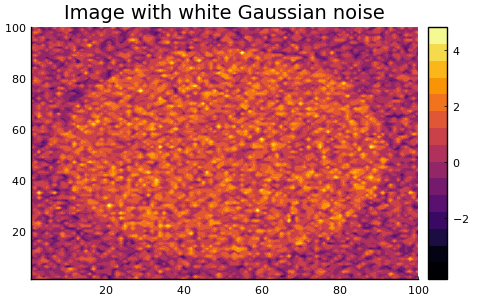

sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'


In [2]:
contourf(images[:,:,1])
title!("Image with white Gaussian noise")

SVD is often used for image compression and noise reduction by decomposing the image matrix into its component parts and filtering out lower-rank components that typically represent noise.

cumulative variance: 0.5329840954319124

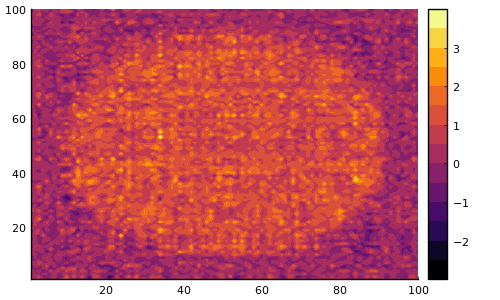

sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'


In [3]:
using LinearAlgebra: svd, Diagonal
using Statistics: mean,std
img = images[:,:,1]
U , S, V = svd(img)
rank_approx=10

cumulative_var = sum(S[i]^2 for i in 1: rank_approx) / sum(S[i]^2 for i in 1: length(S))
print("cumulative variance: ", cumulative_var) 
#Denoising the image
S = Diagonal(S)
denoised_image = U[:, 1: rank_approx] * S[1:rank_approx, 1:rank_approx] * transpose(V[:, 1:rank_approx ])
contourf(denoised_image)

(10000, 50)

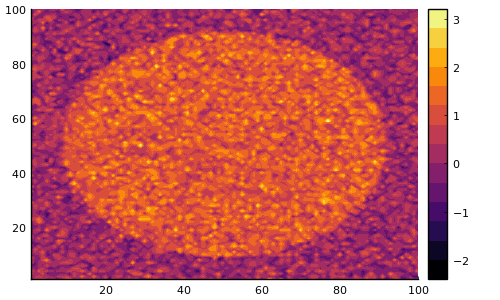

sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'


In [4]:
M = reshape(images, grid_size^2, nb_images)
function denoise_images(rank_approx, images)
    U,S,V = svd(images)
    S= Diagonal(S[1:rank_approx])
    denoised_images = U[:, 1:rank_approx] * S * transpose(V[:, 1:rank_approx])
    return(denoised_images)
end 
denoised_images = denoise_images(10, M)
print(size(denoised_images))
denoised_images = reshape(denoised_images, (100,100,50))
contourf(denoised_images[:,:,1])

The second method is inherently better for denoising because it takes advantage of more data and can discern patterns across multiple images, resulting in a more accurate representation of shapes and details.

In [5]:
using LinearAlgebra
#Calculating the MSE
MSE = (1/(nb_images*grid_size^2)) * sum(norm(images[:,:,i] - denoised_images[:,:,i])^2 for i in 1:nb_images)

0.782137186063044

In [10]:
pyplot(size=(1000,350))
t= -10:0.01:10
s_values = s(t)
# Plot the function
plot(t, s_values, label="s(t)", xlabel="t", ylabel="s(t)", title="Plot of the signal function s(t)")

LoadError: UndefVarError: `s` not defined

In [268]:
N=1000
reflector_delays=[12,25,35]
reflector_var = [3,2,1]
white_noise_var = 1
T=50
time = 0:T-1

0:49

In [306]:
Y = Vector{Vector{Float64}}(undef, N)

for i in 1:N
    #Y[i] = sum(s(time .- reflector_delays[k]) .* (rand(Normal(0, reflector_var[k])) ) for k in 1:3) .+ rand(Normal(0, white_noise_var), length(time))
    signal_contribution = sum(s(time .- reflector_delays[k]) .* rand(Normal(0, reflector_var[k])) for k in 1:3)
    noise_contribution = rand(Normal(0, white_noise_var), length(time))  # Adding white noise to the entire signal
    Y[i] = signal_contribution .+ noise_contribution  # Sum of signal + noise
end


In [307]:
print(var(noise_contribution))

1.2346563508872028

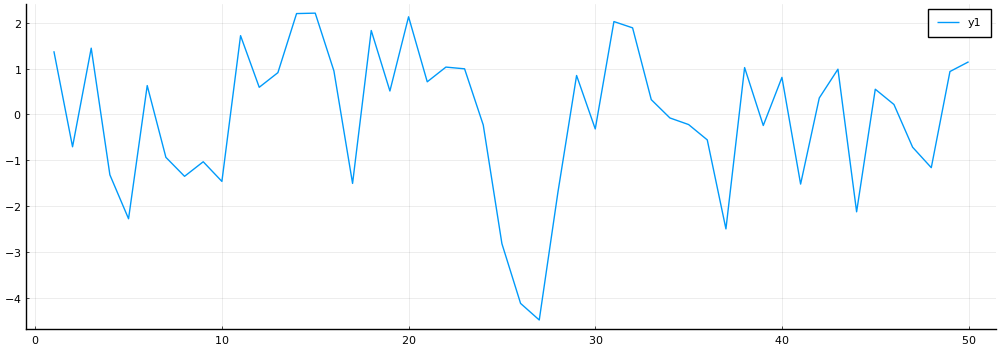

In [308]:
plot(Y[1])

In [309]:
#Covariance matrix
R = (1/N) .* sum(Y[i] * transpose(Y[i]) for i in 1:N)

50×50 Matrix{Float64}:
  0.999954     -0.0670562    -0.00289811  …  -0.0711175     0.0331739
 -0.0670562     1.06708       0.0175178       0.00950933   -0.014322
 -0.00289811    0.0175178     0.975465       -0.02993      -0.0599051
 -0.000137968   0.0318531     0.0298977       0.00573578   -0.0579747
  0.052608      0.0220197     0.0400903      -0.035407     -0.0597953
 -0.0457106     0.0055026     0.108188    …   0.0174829    -0.0196495
 -0.0882452     0.0707585     0.0654288       0.0410886     0.00297749
 -0.0688876     0.0892009     0.111887        0.117996     -0.0132903
 -0.00914949    0.000600079   0.0881156       0.0432048    -0.00599978
  0.0472197    -0.00406375    0.00760866     -0.0243762    -0.0499035
  0.069432     -0.0389004    -0.136143    …  -0.0539588     0.0426742
  0.142219     -0.00500417   -0.302236       -0.130977     -0.0134347
  0.102167     -0.00418605   -0.34585        -0.0925707     0.0109966
  ⋮                                       ⋱                
  0.00

Subspace method to estimate the time delays 

In [310]:
eigen_decomp = eigen(R) 
U = eigen_decomp.vectors
D = eigen_decomp.values 
D

50-element Vector{Float64}:
  0.6325433172748944
  0.6395360536057971
  0.6750092176278486
  0.69574278968964
  0.7171789996424155
  0.7347905535120834
  0.7360719653350836
  0.7609320345096273
  0.7750482636187437
  0.791812153441212
  0.8064226729017892
  0.8227524196282844
  0.8348345934655654
  ⋮
  1.255977373254059
  1.2745487813090373
  1.2947512296460677
  1.3140322145924288
  1.3215775128835614
  1.3521229306286005
  1.3655370690430826
  1.4234486495607892
  1.5076546893476994
  4.602834728019963
 16.371681878877588
 36.292573961959874

Theoretically
### Ry = U × diag{λ1 + $\sigma_w^2$, . . . , λp + $\sigma_w^2$, $\sigma_w^2$, . . . , $\sigma_w^2$} × $U^T$

As N increases, the estimate of the covariance matrix becomes more accurate, which leads to more accurate estimates of the eigenvalues. This means that the eigenvalues that correspond to the noise subspace should become closer to 1 as N increases.

In [311]:
D = Diagonal(D) 
U*D*U' 

50×50 Matrix{Float64}:
  0.999954     -0.0670562    -0.00289811  …  -0.0711175     0.0331739
 -0.0670562     1.06708       0.0175178       0.00950933   -0.014322
 -0.00289811    0.0175178     0.975465       -0.02993      -0.0599051
 -0.000137968   0.0318531     0.0298977       0.00573578   -0.0579747
  0.052608      0.0220197     0.0400903      -0.035407     -0.0597953
 -0.0457106     0.0055026     0.108188    …   0.0174829    -0.0196495
 -0.0882452     0.0707585     0.0654288       0.0410886     0.00297749
 -0.0688876     0.0892009     0.111887        0.117996     -0.0132903
 -0.00914949    0.000600079   0.0881156       0.0432048    -0.00599978
  0.0472197    -0.00406375    0.00760866     -0.0243762    -0.0499035
  0.069432     -0.0389004    -0.136143    …  -0.0539588     0.0426742
  0.142219     -0.00500417   -0.302236       -0.130977     -0.0134347
  0.102167     -0.00418605   -0.34585        -0.0925707     0.0109966
  ⋮                                       ⋱                
  0.00